In [1]:
import numpy as np
import scipy.signal
from one.api import ONE
from brainbox.io.one import SpikeSortingLoader

one = ONE(base_url='https://openalyx.internationalbrainlab.org')
t0 = 10 # timepoint in recording to stream

# pid = 'da8dfec1-d265-44e8-84ce-6ae9c109b8bd'
# pid = '6f6d2c8e-28be-49f4-ae4d-06be2d3148c1' # kilosort4 paper fig 2
# pid2 = 'eebcaf65-7fa4-4118-869d-a084e84530e2' # visual areas
# pid2 = '70da415f-444d-4148-ade7-a1f58a16fcf8' # # visual areas + midbrain
pid1 = 'c4f6665f-8be5-476b-a6e8-d81eeae9279d' # primary visual area, CA1, midbrain; danlab
pid2 = '73ff4936-8cd3-4a75-a772-f563e67d249d' # primary motor area and Striatum; angelakilab
pid3 = '749cb2b7-e57e-4453-a794-f6230e4d0226' # secondary motor areas; mrsicflogellab
ssl1 = SpikeSortingLoader(pid=pid1, one=one)
ssl2 = SpikeSortingLoader(pid=pid2, one=one)
ssl3 = SpikeSortingLoader(pid=pid3, one=one)
# The channels information is contained in a dict table / dataframe
channels1 = ssl1.load_channels()
channels2 = ssl2.load_channels()
channels3 = ssl3.load_channels()

# Get AP and LFP spikeglx.Reader objects
# sr_lf = ssl.raw_electrophysiology(band="lf", stream=True)
sr_ap1 = ssl1.raw_electrophysiology(band="ap", stream=True)
sr_ap2 = ssl2.raw_electrophysiology(band="ap", stream=True)
sr_ap3 = ssl3.raw_electrophysiology(band="ap", stream=True)

ModuleNotFoundError: No module named 'one'

In [2]:
trials1 = one.load_object(ssl1.eid, 'trials', collection='alf')
trials2 = one.load_object(ssl2.eid, 'trials', collection='alf')
trials3 = one.load_object(ssl3.eid, 'trials', collection='alf')


In [152]:
trials2.keys()

dict_keys(['stimOff_times', 'goCueTrigger_times', 'feedbackType', 'contrastLeft', 'contrastRight', 'rewardVolume', 'goCue_times', 'choice', 'feedback_times', 'stimOn_times', 'response_times', 'firstMovement_times', 'probabilityLeft', 'intervals'])

In [3]:
print(trials1.keys())
trials_to_use1 = np.where(np.logical_and(trials1['contrastRight']==1,trials1['choice']==-1))
trials_to_use2 = np.where(np.logical_and(trials2['contrastRight']==1,trials2['choice']==-1))
trials_to_use3 = np.where(np.logical_and(trials3['contrastRight']==1,trials3['choice']==-1))

dict_keys(['goCueTrigger_times', 'stimOff_times', 'response_times', 'rewardVolume', 'feedbackType', 'contrastRight', 'firstMovement_times', 'goCue_times', 'choice', 'contrastLeft', 'probabilityLeft', 'stimOn_times', 'feedback_times', 'intervals'])


In [217]:
trials_to_use2

(array([  3,   6,  28,  32,  33,  48,  77,  79,  82,  83,  94,  97,  98,
        107, 112, 116, 122, 177, 184, 190, 194, 218, 293, 336, 337, 352,
        356, 362, 366, 370, 378, 382, 439, 440, 442, 445, 453, 454, 457,
        462, 464, 465, 477, 481, 486, 517, 518, 531, 539, 583, 596, 617,
        623, 624, 639, 647, 648, 655]),)

In [153]:
stimOn_times1 = trials1['stimOn_times'][trials_to_use1]
stimOn_times2 = trials2['firstMovement_times'][trials_to_use2]
stimOn_times3 = trials3['stimOn_times'][trials_to_use3]
event_no = 11
# timepoint in recording to stream, as per the experiment main clock
t_event1 = stimOn_times1[event_no]
t_event2 = stimOn_times2[event_no]
t_event3 = stimOn_times3[event_no]

# corresponding sample in the AP data
s_event1 = int(ssl1.samples2times(stimOn_times1[event_no], direction='reverse'))
s_event2 = int(ssl2.samples2times(stimOn_times2[event_no], direction='reverse'))
s_event3 = int(ssl3.samples2times(stimOn_times3[event_no], direction='reverse'))

print(f'raw AP band sample for event1 at time1 {t_event1}: {s_event1}')
print(f'raw AP band sample for event2 at time2 {t_event2}: {s_event2}')
print(f'raw AP band sample for event3 at time3 {t_event3}: {s_event3}')

# get the AP data surrounding samples
window_secs_ap = [-0.1, 0.3]  # we'll look at 50ms before and after the event for AP
first1, last1 = (int(window_secs_ap[0] * sr_ap1.fs) + s_event1, int(window_secs_ap[1] * sr_ap1.fs + s_event1))
raw_ap1 = sr_ap1[first1:last1, :-sr_ap1.nsync].T
first2, last2 = (int(window_secs_ap[0] * sr_ap2.fs) + s_event2, int(window_secs_ap[1] * sr_ap2.fs + s_event2))
raw_ap2 = sr_ap2[first2:last2, :-sr_ap2.nsync].T
first3, last3 = (int(window_secs_ap[0] * sr_ap3.fs) + s_event3, int(window_secs_ap[1] * sr_ap3.fs + s_event3))
raw_ap3 = sr_ap3[first3:last3, :-sr_ap3.nsync].T

# get the LF data surrounding samples
# window_secs_ap = [-0.750, 0.750]  # we'll look at 750ms before and after the event because LF varies more slowly in time
# sample_lf = s_event // 12  # NB: for neuropixel probes this is always 12 because AP is sampled at 12x the frequency of LF
# first, last = (int(window_secs_ap[0] * sr_lf.fs) + sample_lf, int(window_secs_ap[1] * sr_lf.fs + sample_lf))
# raw_lf = sr_lf[first:last, :-sr_lf.nsync].T

raw AP band sample for event1 at time1 464.8709082604649: 13946257
raw AP band sample for event2 at time2 478.75478415007336: 14362621
raw AP band sample for event3 at time3 711.006058950711: 21330270


In [ ]:
stimOn_times2 = trials2['firstMovement_times'][trials_to_use2]
event_no = 57
# timepoint in recording to stream, as per the experiment main clock
t_event2 = stimOn_times2[event_no]

# corresponding sample in the AP data
s_event2 = int(ssl2.samples2times(stimOn_times2[event_no], direction='reverse'))

print(f'raw AP band sample for event2 at time2 {t_event2}: {s_event2}')

# get the AP data surrounding samples
window_secs_ap = [-0.1, 0.27]  # we'll look at 50ms before and after the event for AP
first2, last2 = (int(window_secs_ap[0] * sr_ap2.fs) + s_event2, int(window_secs_ap[1] * sr_ap2.fs + s_event2))
raw_ap2 = sr_ap2[first2:last2, :-sr_ap2.nsync].T
sos_ap2 = scipy.signal.butter(3, [250 / sr_ap2.fs /2, 5000 / sr_ap1.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
filtered_ap2 = scipy.signal.sosfiltfilt(sos_ap2, raw_ap2)

raw AP band sample for event2 at time2 591.5637841500735: 17746885
Downloading: /home/smoconn/Downloads/ONE/openalyx.internationalbrainlab.org/cache/ap/angelakilab/Subjects/NYU-21/2020-08-19/001/raw_ephys_data/probe00/chunk_000591_to_000591/_spikeglx_ephysData_g0_t0.imec0.ap.2d94f17a-0f96-4eb9-be47-3b62be02f20f.cbin Bytes: 9068109


100%|██████████| 8.648022651672363/8.648022651672363 [00:00<00:00, 16.02it/s]


In [ ]:
# sos_ap1 = scipy.signal.butter(3, 300 / sr_ap1.fs /2, btype='highpass', output='sos')  # 300 Hz high pass AP band
sos_ap1 = scipy.signal.butter(3, [250 / sr_ap1.fs /2, 5000 / sr_ap1.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
# sos_lf = scipy.signal.butter(3,   2 / sr_lf.fs /2, btype='highpass', output='sos')  #   2 Hz high pass LF band
filtered_ap1 = scipy.signal.sosfiltfilt(sos_ap1, raw_ap1)
# filtered_lf = scipy.signal.sosfiltfilt(sos_lf, raw_lf)
sos_ap2 = scipy.signal.butter(3, [250 / sr_ap2.fs /2, 5000 / sr_ap2.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
filtered_ap2 = scipy.signal.sosfiltfilt(sos_ap2, raw_ap2)
sos_ap3 = scipy.signal.butter(3, [250 / sr_ap3.fs /2, 5000 / sr_ap3.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
filtered_ap3 = scipy.signal.sosfiltfilt(sos_ap3, raw_ap3)

# displays the AP band and LFP band around this stim_on event
# fig, axs = plt.subplots(2, 2, gridspec_kw={'width_ratios': [.95, .05]}, figsize=(18, 12))
# Density(- filtered_ap, fs=sr_ap.fs, taxis=1, ax=axs[0, 0])
# plot_brain_regions(channels["atlas_id"], channel_depths=channels["axial_um"], ax = axs[0, 1], display=True)
# Density(- filtered_lf, fs=sr_lf.fs, taxis=1, ax=axs[1, 0])
# plot_brain_regions(channels["atlas_id"], channel_depths=channels["axial_um"], ax = axs[1, 1], display=True)

In [11]:
spikes1, clusters1, channels1 = ssl1.load_spike_sorting(revision='2024-05-06',dataset_types=['clusters.amps', 'spikes.samples'])
clusters1 = ssl1.merge_clusters(spikes1, clusters1, channels1)
waveforms1 = ssl1.load_spike_sorting_object('waveforms')
spikes2, clusters2, channels2 = ssl2.load_spike_sorting(revision='2024-05-06',dataset_types=['clusters.amps', 'spikes.samples'])
clusters2 = ssl2.merge_clusters(spikes2, clusters2, channels2)
waveforms2 = ssl2.load_spike_sorting_object('waveforms')
spikes3, clusters3, channels3 = ssl3.load_spike_sorting(revision='2024-05-06',dataset_types=['clusters.amps', 'spikes.samples'])
clusters3 = ssl3.merge_clusters(spikes3, clusters3, channels3)
waveforms3 = ssl3.load_spike_sorting_object('waveforms')

In [61]:
print(dir(waveforms1))
print(waveforms1.keys())
print(waveforms1['templates'].shape)
print(clusters1.keys())
print(clusters1['channels'])
print(clusters1['cluster_id'])
spikes1

['__class__', '__class_getitem__', '__contains__', '__delattr__', '__delitem__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__ior__', '__iter__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__or__', '__reduce__', '__reduce_ex__', '__repr__', '__reversed__', '__ror__', '__setattr__', '__setitem__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'append', 'check_dimensions', 'clear', 'copy', 'from_df', 'fromkeys', 'get', 'items', 'keys', 'load', 'pop', 'popitem', 'save', 'setdefault', 'templates', 'to_df', 'update', 'values']
dict_keys(['templates'])
(1111, 40, 128)
dict_keys(['amps', 'channels', 'depths', 'uuids', 'cluster_id', 'amp_max', 'amp_min', 'amp_median', 'amp_std_dB', 'contamination', 'contamination_alt', 'drift', 'missed_spikes_est', 'noise_cutoff', 'presence_ratio', 'presence_ratio_std', 'slidingRP_viol', 'spik

{'amps': array([9.36481722e-05, 2.32071693e-05, 1.12250039e-04, ...,
        1.68497108e-04, 1.35174605e-05, 6.64967679e-05]),
 'clusters': array([ 932,  801,   65, ...,  541, 1003,    2], dtype=uint32),
 'depths': array([3097.04785156, 2531.16381836,  173.9710083 , ...,  695.24731445,
        3676.46166992,   24.97249603]),
 'samples': array([       25,        25,        29, ..., 114830380, 114830390,
        114830534], dtype=uint64),
 'times': array([7.71874126e-04, 7.71874126e-04, 9.05206231e-04, ...,
        3.82764391e+03, 3.82764424e+03, 3.82764904e+03])}

In [30]:
print(sum(clusters1['labels']==1))
print(len(clusters1['bitwise_fail']))
sum(clusters1['bitwise_fail']==0)

0
1111


68

In [26]:
print(sum(clusters2['labels']==1))
print(len(clusters2['bitwise_fail']))
sum(clusters2['bitwise_fail']==0)

38
591


49

In [87]:
import numpy as np
print(np.unique(clusters1['acronym']))
print(np.unique(clusters2['acronym']))
print(np.unique(clusters3['acronym']))

['APN' 'CA1' 'DG-mo' 'DG-sg' 'LP' 'MRN' 'POL' 'VISp5' 'VISp6a' 'VISpm2/3'
 'VISpm4' 'VISpm5' 'VISpm6a' 'VISpm6b' 'alv' 'bsc' 'fp' 'or']
['BST' 'CP' 'MOp5' 'MOp6a' 'MOp6b' 'PAL' 'STR' 'ccb' 'cing']
['AON' 'DP' 'FRP6a' 'MOs2/3' 'MOs5' 'MOs6a' 'ORBm6a' 'ORBvl6a']


In [135]:
clusts1_VISpm4 = np.where(np.logical_and(clusters1['acronym']=='VISpm4',clusters1['bitwise_fail']==0))[0]
clusts1_VISp5 = np.where(np.logical_and(clusters1['acronym']=='VISp5',clusters1['bitwise_fail']==0))[0]
clusts1_CA1 = np.where(np.logical_and(clusters1['acronym']=='CA1',clusters1['bitwise_fail']==0))[0]

chans1_VISpm4 = np.unique(clusters1['channels'][clusts1_VISpm4])
chans1_VISp5 = np.unique(clusters1['channels'][clusts1_VISp5])
chans1_CA1 = np.unique(clusters1['channels'][clusts1_CA1])
# chans=np.arange(345,355)
print(chans1_VISpm4)
print(chans1_VISp5)
print(chans1_CA1)

[347 349 350 353]
[325]
[251 255 256 258 266 273 275]


In [9]:
print(clusts2_MOp5)
clusters2['cluster_id'][499]

NameError: name 'clusts2_MOp5' is not defined

In [14]:
clusts2_MOp5 = np.where(np.logical_and(clusters2['acronym']=='MOp5',clusters2['bitwise_fail']==0))[0]
clusts2_MOp5=np.delete(clusts2_MOp5,2)
clusts2_MOp6a = np.where(np.logical_and(clusters2['acronym']=='MOp6a',clusters2['bitwise_fail']==0))[0]
clusts2_MOp6b = np.where(np.logical_and(clusters2['acronym']=='MOp6b',clusters2['bitwise_fail']==0))[0]
clusts2_CP = np.where(np.logical_and(clusters2['acronym']=='CP',clusters2['bitwise_fail']==0))[0]

chans2_MOp5 = np.unique(clusters2['channels'][clusts2_MOp5])
chans2_MOp6a = np.unique(clusters2['channels'][clusts2_MOp6a])
chans2_MOp6b = np.unique(clusters2['channels'][clusts2_MOp6b])
chans2_CP = np.unique(clusters2['channels'][clusts2_CP])
# chans=np.arange(345,355)
print(chans2_MOp5)
print(chans2_MOp6a)
print(chans2_MOp6b)
print(chans2_CP)

[366 370 377 382]
[318 325 327 329 337 341 349 350]
[317]
[152 153 162 170 184 192 201 214 216 222 228 234 248 289]


In [ ]:
import ibldsp.voltage
import plotly.graph_objects as go
destriped = ibldsp.voltage.destripe(filtered_ap1, sr_ap1.fs, channel_labels=channels1['labels'])
data_full = destriped.T
chans=chans1_VISpm4
data_r = data_full[:,chans]
fig = go.Figure()
colors = ['rgb(0,0,255)','rgb(0,255,255)','rgb(255,0,255)','rgb(255,0,0)','rgb(255,255,0)']
for ii, iClust in enumerate(clusts1_VISpm4):
    spikes_in_clust1 = spikes1['clusters']==clusts1_VISpm4[ii]
    spikes1_samples = spikes1['samples'][spikes_in_clust1]
    spikes1_samples_in_bounds = spikes1_samples[np.logical_and(spikes1_samples<last1, spikes1_samples>first1)]-first1
    for iTime in spikes1_samples_in_bounds:
        fig.add_vrect(
            x0=iTime-30,
            x1=iTime+30,
            line_width=0,
            fillcolor=colors[ii],
            opacity=0.4
        )
for ch in range(data_r.shape[1]):
    fig.add_trace(go.Scatter(y=data_r[:60000, ch] - ch * -1e-4,line_color='black'))
# fig = px.line(data_r[:120000, [1, 2, 4, 13, 14, 15]])
# add the spike times
fig.add_trace
fig.update_layout(
    yaxis=dict(
        tickmode="array",
        tickvals=np.arange(0, -1e-4 * data_r.shape[1], -1e-4),
        ticktext=np.arange(data_r.shape[1]),
    ),
    template="plotly_white"
)

fig.show()


In [162]:
print(chans2_MOp5)

[366 370 373 377 382]


In [12]:
stimOn_times2 = trials2['firstMovement_times'][trials_to_use2]
event_no = 27
# timepoint in recording to stream, as per the experiment main clock
t_event2 = stimOn_times2[event_no]

# corresponding sample in the AP data
s_event2 = int(ssl2.samples2times(stimOn_times2[event_no], direction='reverse'))

print(f'raw AP band sample for event2 at time2 {t_event2}: {s_event2}')

# get the AP data surrounding samples
window_secs_ap = [-1, 1]  # we'll look at 50ms before and after the event for AP
first2, last2 = (int(window_secs_ap[0] * sr_ap2.fs) + s_event2, int(window_secs_ap[1] * sr_ap2.fs + s_event2))
raw_ap2 = sr_ap2[first2:last2, :-sr_ap2.nsync].T
sos_ap2 = scipy.signal.butter(3, [250 / sr_ap2.fs /2, 5000 / sr_ap1.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
filtered_ap2 = scipy.signal.sosfiltfilt(sos_ap2, raw_ap2)

raw AP band sample for event2 at time2 1654.2737841500743: 49628135
Downloading: /home/smoconn/Downloads/ONE/openalyx.internationalbrainlab.org/cache/ap/angelakilab/Subjects/NYU-21/2020-08-19/001/raw_ephys_data/probe00/chunk_001653_to_001655/_spikeglx_ephysData_g0_t0.imec0.ap.2d94f17a-0f96-4eb9-be47-3b62be02f20f.cbin Bytes: 27091333


100%|██████████| 25.836308479309082/25.836308479309082 [00:00<00:00, 33.82it/s]


In [295]:
len(trials_to_use2[0])

58

In [16]:
import ibldsp.voltage
import plotly.graph_objects as go
stimOn_times2 = trials2['firstMovement_times'][trials_to_use2]
event_no = np.random.choice(np.arange(len(trials_to_use2[0])))
event_no=57
print(event_no)
# event_no = 25 # good, 2
# event_no = 29 # goodgood, 2
# event_no = 32 # good, 2
# event_no = 38 # highly active
# event_no = 51
# timepoint in recording to stream, as per the experiment main clock
t_event2 = stimOn_times2[event_no]

# corresponding sample in the AP data
s_event2 = int(ssl2.samples2times(stimOn_times2[event_no], direction='reverse'))

print(f'raw AP band sample for event2 at time2 {t_event2}: {s_event2}')

# get the AP data surrounding samples
window_secs_ap = [-0.1, 0.27]  # we'll look at 50ms before and after the event for AP
first2, last2 = (int(window_secs_ap[0] * sr_ap2.fs) + s_event2, int(window_secs_ap[1] * sr_ap2.fs + s_event2))
raw_ap2 = sr_ap2[first2:last2, :-sr_ap2.nsync].T
sos_ap2 = scipy.signal.butter(3, [250 / sr_ap2.fs /2, 5000 / sr_ap1.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
filtered_ap2 = scipy.signal.sosfiltfilt(sos_ap2, raw_ap2)
destriped = ibldsp.voltage.destripe(filtered_ap2, sr_ap2.fs, channel_labels=channels2['labels'])
data_full = destriped.T
# chans = np.delete(chans2_MOp5,0)
chans = chans2_MOp5
# chans=np.arange(min(chans2_MOp5),max(chans2_MOp5))
data_r = data_full[:,chans]
fig = go.Figure()
colors = ['rgb(0,0,255)','rgb(0,255,255)','rgb(255,0,255)','rgb(255,0,0)','rgb(255,255,0)','rgb(255,128,0)','rgb(255,128,128)','rgb(255,0,25)', 'rgb(128,128,0)']
for ii, iClust in enumerate(clusts2_MOp5):
    spikes_in_clust2 = spikes2['clusters']==clusts2_MOp5[ii]
    spikes2_samples = spikes2['samples'][spikes_in_clust2]
    spikes2_samples_in_bounds = spikes2_samples[np.logical_and(spikes2_samples<last2, spikes2_samples>first2)]-first2
    # add the spike times
    for iTime in spikes2_samples_in_bounds:
        fig.add_vrect(
            x0=iTime-30,
            x1=iTime+30,
            line_width=0,
            fillcolor=colors[ii],
            opacity=0.6
        )
for ch in range(data_r.shape[1]):
    fig.add_trace(go.Scatter(y=data_r[:60000, ch] - ch * -1e-4,line_color='black'))
fig.add_vline(
    100*sr_ap2.fs/1000, line_color='red', line_width=4
)
fig.update_layout(
    yaxis=dict(
        tickmode="array",
        tickvals=np.arange(0, -1e-4 * data_r.shape[1], -1e-4),
        ticktext=np.arange(data_r.shape[1]),
    ),
    width=1000,height=700,
    template="plotly_white"
)

fig.show()
# fig.write_image(
#     f'channels_{chans}_brainarea_MOp5_trial{event_no}.svg'
# )


57
raw AP band sample for event2 at time2 3057.6597841500757: 91729650


In [17]:
# import ibldsp.voltage
# import plotly.graph_objects as go
stimOn_times2 = trials2['firstMovement_times'][trials_to_use2]
event_no = np.random.choice(np.arange(len(trials_to_use2[0])))
event_no=57
print(event_no)
# event_no = 25 # good, 2
# event_no = 29 # goodgood, 2
# event_no = 32 # good, 2
# event_no = 38 # highly active
# event_no = 51
# timepoint in recording to stream, as per the experiment main clock
t_event2 = stimOn_times2[event_no]

# corresponding sample in the AP data
s_event2 = int(ssl2.samples2times(stimOn_times2[event_no], direction='reverse'))

print(f'raw AP band sample for event2 at time2 {t_event2}: {s_event2}')

# get the AP data surrounding samples
window_secs_ap = [0.07, 0.27]  # we'll look at 50ms before and after the event for AP
first2, last2 = (int(window_secs_ap[0] * sr_ap2.fs) + s_event2, int(window_secs_ap[1] * sr_ap2.fs + s_event2))
raw_ap2 = sr_ap2[first2:last2, :-sr_ap2.nsync].T
sos_ap2 = scipy.signal.butter(3, [250 / sr_ap2.fs /2, 5000 / sr_ap1.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
filtered_ap2 = scipy.signal.sosfiltfilt(sos_ap2, raw_ap2)
destriped = ibldsp.voltage.destripe(filtered_ap2, sr_ap2.fs, channel_labels=channels2['labels'])
data_full = destriped.T
# chans = np.delete(chans2_MOp5,0)
chans = chans2_MOp5
# chans=np.arange(min(chans2_MOp5),max(chans2_MOp5))
data_r = data_full[:,chans]
fig = go.Figure()
colors = ['rgb(0,0,255)','rgb(0,255,255)','rgb(255,0,255)','rgb(255,0,0)','rgb(255,255,0)','rgb(255,128,0)','rgb(255,128,128)','rgb(255,0,25)', 'rgb(128,128,0)']
for ii, iClust in enumerate(clusts2_MOp5):
    spikes_in_clust2 = spikes2['clusters']==clusts2_MOp5[ii]
    spikes2_samples = spikes2['samples'][spikes_in_clust2]
    spikes2_samples_in_bounds = spikes2_samples[np.logical_and(spikes2_samples<last2, spikes2_samples>first2)]-first2
    # add the spike times
    for iTime in spikes2_samples_in_bounds:
        fig.add_vrect(
            x0=iTime-30,
            x1=iTime+30,
            line_width=0,
            fillcolor=colors[ii],
            opacity=0.6
        )
for ch in range(data_r.shape[1]):
    fig.add_trace(go.Scatter(y=data_r[:60000, ch] - ch * -1e-4,line_color='black'))
# fig.add_vline(
#     100*sr_ap2.fs/1000, line_color='red', line_width=4
# )
fig.update_layout(
    yaxis=dict(
        tickmode="array",
        tickvals=np.arange(0, -1e-4 * data_r.shape[1], -1e-4),
        ticktext=np.arange(data_r.shape[1]),
    ),
    width=1400,height=700,
    template="plotly_white"
)

fig.show()
fig.write_image(
    f'channels_{chans}_brainarea_MOp5_trial{event_no}_zoom.svg'
)


57
raw AP band sample for event2 at time2 3057.6597841500757: 91729650


In [52]:
clusts2_mod_MOp5=np.delete(clusts2_MOp5,2)
clusts2_mod_MOp5
filtered_ap2.shape
spikes_in_clust2 = spikes2['clusters']==clusts2_mod_MOp5[0]
sum(spikes_in_clust2)
chans2_MOp5
sr_ap2.fs
wave_width

60

In [56]:
from plotly.subplots import make_subplots
import ibldsp.voltage

window_secs_ap = [-60,2]
first2, last2 = (int(window_secs_ap[0] * sr_ap2.fs) + s_event2, int(window_secs_ap[1] * sr_ap2.fs + s_event2))
raw_ap2 = sr_ap2[first2:last2, :-sr_ap2.nsync].T
sos_ap2 = scipy.signal.butter(5, [250 / sr_ap2.fs /2, 5000 / sr_ap1.fs /2], btype='bandpass', output='sos')  # 300 Hz high pass AP band
print('filtering ...')
filtered_ap2 = scipy.signal.sosfiltfilt(sos_ap2, raw_ap2)
# destriped = ibldsp.voltage.destripe(filtered_ap2, sr_ap2.fs, channel_labels=channels2['labels'])
# data_full = destriped.T
data_full = filtered_ap2
chans = chans2_MOp5
data_r = data_full[:,chans]
wave_width = int(2*sr_ap2.fs / 1000) # 1ms
list_of_wave_arrays = []
clusts2_mod_MOp5=np.delete(clusts2_MOp5,2)
print('starting wave extraction...')

filtered_ap2 = filtered_ap2.T
for iClust in clusts2_mod_MOp5:
    spikes_in_clust2 = spikes2['clusters']==iClust
    spikes2_samples = spikes2['samples'][spikes_in_clust2]
    spikes2_samples_in_bounds = spikes2_samples[np.logical_and(spikes2_samples<last2, spikes2_samples>first2)]-first2
    
    # add the spike times
    num_spikes_this_unit = int(len(spikes2_samples_in_bounds))
    print(f'num spikes this unit is {num_spikes_this_unit}')
    wave_array = np.zeros(
        (num_spikes_this_unit, 2 * wave_width, len(chans))
    )  # size is (num_spikes, 2*wave_width, num_chans)
    # set_trace()
    for jj, jTime in enumerate(spikes2_samples_in_bounds):
        snip = filtered_ap2[
                int(jTime - wave_width) : int(jTime + wave_width), chans
            ]
        try:
            wave_array[jj, :, :] = snip
        except ValueError:
            print("encountered error")
            print(f"invalid times were: {int(jTime - wave_width)} and {int(jTime + wave_width)}")
            continue
    list_of_wave_arrays.append(wave_array)
    print(f'done cluster {iClust}')
    
print('plotting')
fig = make_subplots(
        rows=1,
        cols=len(list_of_wave_arrays),
        shared_xaxes=True,
        shared_yaxes=True,
        # subplot_titles=(f"Session Info: {session_ID}", f"Session Info: {session_ID}"),
    )
for ii, wave_array in enumerate(list_of_wave_arrays):
    wave_array_mean = wave_array.mean(0)
    for iChan in range(wave_array.shape[2]):
        fig.add_trace(
            go.Scatter(
                x=np.arange(wave_array.shape[1]),
                y=wave_array_mean[:, iChan] + 1e-4 * iChan/2,
                line_color = 'black',
            ),
            row=1,
            col=ii + 1,
        )
# set theme to chosen template and shift the
fig.update_layout(template='plotly_white')



# time_stamp = datetime.now().strftime("%Y%m%d_%H%M%S")
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)
# fig.write_html(
#     str(path_to_write_to.with_stem(path_to_write_to.stem + "_" + time_stamp))
# )
fig.show()
fig.write_image("cortical_data_MOp5_mean_waves.svg")

filtering ...
starting wave extraction...
num spikes this unit is 280
done cluster 478
num spikes this unit is 1952
done cluster 493
num spikes this unit is 129
done cluster 518
plotting


{'color': 'k', 'linewidth': 0}
{'color': 'k', 'linewidth': 0.5}
{'color': 'k', 'linewidth': 0}
{'color': 'k', 'linewidth': 0.5}
{'color': 'k', 'linewidth': 0}
{'color': 'k', 'linewidth': 0.5}
{'color': 'k', 'linewidth': 0}
{'color': 'k', 'linewidth': 0.5}


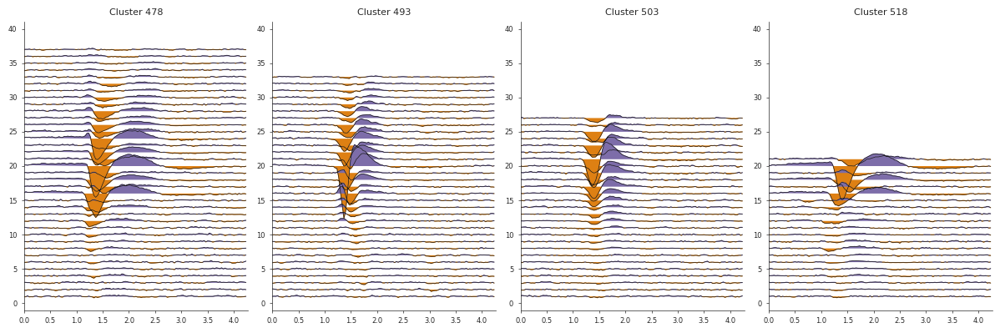

In [50]:
import matplotlib.pyplot as plt
import numpy as np
import ibldsp.waveforms
from ibl_style.style import figure_style
figure_style()

# matches = np.where(clusters['label'] ==1)[0]
# matches = np.where(np.logical_and(clusters1['acronym'] == 'VISpm4',clusters1['bitwise_fail'] == 0))[0]
# print(matches)
# cids = np.random.choice(matches, 3)
cids = clusts2_MOp5
fig, axs = plt.subplots(1, 4, figsize=(12, 4))
for i, cid in enumerate(cids):
    wf = waveforms2['templates'][cid, :, :]
    ax = ibldsp.waveforms.double_wiggle(wf * 1e6 / 80, fs=30_000, ax=axs[i])
    ax.set(title=f'Cluster {cid}')

In [54]:
wf.shape

(40, 128)

100%|██████████| 14/14.0 [00:05<00:00,  2.64it/s]


ValueError: too many values to unpack (expected 2)

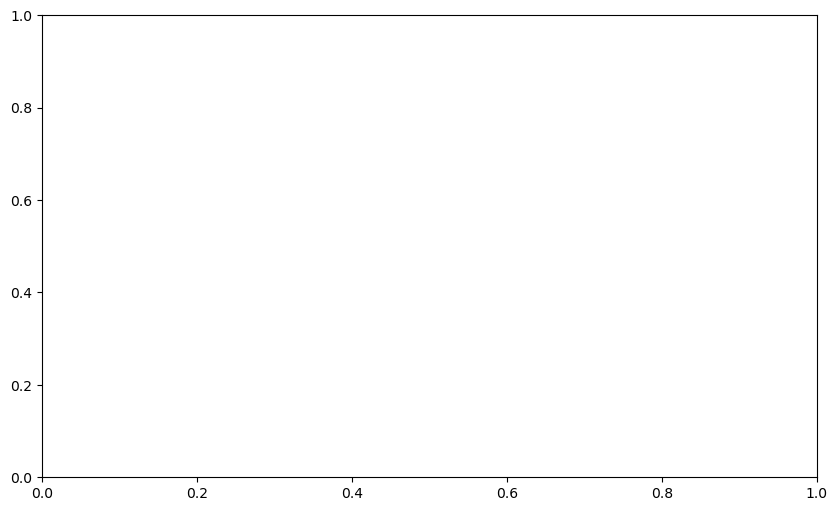

In [60]:
from ibldsp import waveforms
from ibldsp.utils import rms
# instantiating the waveform loader will download the raw waveform arrays and can take a few minutes (~3Gb)
wfl = ssl.raw_waveforms()
ic = np.where(np.logical_and(clusters['acronym'] == 'VISam5', clusters['bitwise_fail'] == 0))[0]
# look at templates

raw_wav, info, channel_map = wfl.load_waveforms(labels=ic[1])

snr = np.zeros(8)
fig, axs = plt.subplots(1, 1, figsize=(10, 6))
axs = 4*[axs]
for i, ax in enumerate(axs):
    # w_stack = np.mean(raw_wav[0, :(2 ** i), :, :], axis=0)
    w_stack = raw_wav[0, :(2 ** i), :, :]
    ax = waveforms.double_wiggle( w_stack  * 1e6 / 80, fs=30_000, ax=axs[i])
    ax.set_title(f"Stack {2 ** i}")
    snr[i] = 20 * np.log10(rms(w_stack[19:22, wfl.trough_offset - 10:wfl.trough_offset + 10].flatten()) / np.mean(rms(w_stack)))

AttributeError: 'numpy.ndarray' object has no attribute 'keys'

Downloading: /home/smoconn/Downloads/ONE/openalyx.internationalbrainlab.org/cache/ap/churchlandlab_ucla/Subjects/UCLA033/2022-02-15/001/raw_ephys_data/probe01/chunk_000009_to_000010/_spikeglx_ephysData_g0_t0.imec1.ap.3be3ee4d-6724-4232-960d-061bb6486c0d.cbin Bytes: 18258115


100%|██████████| 17.4122953414917/17.4122953414917 [00:00<00:00, 25.84it/s]


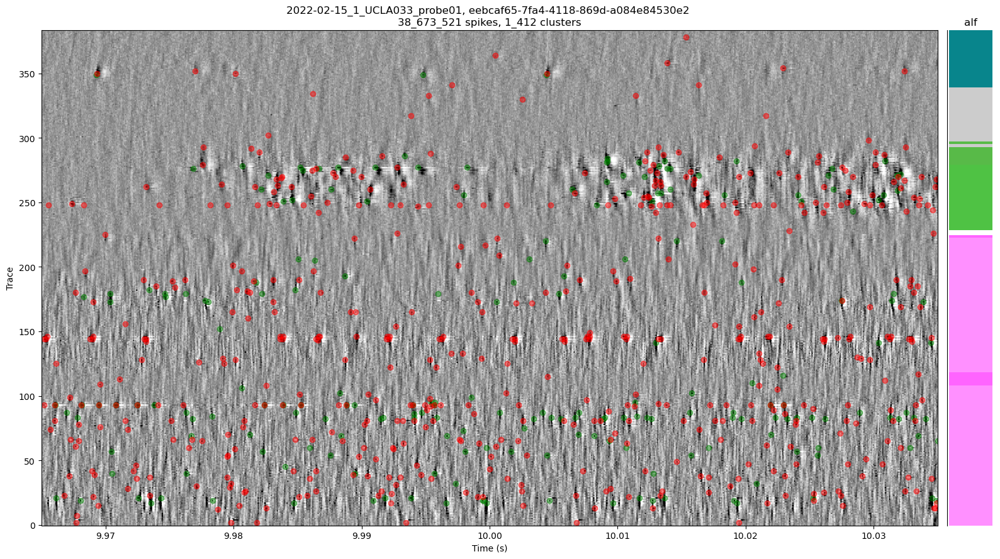

In [51]:
rawplt = ssl.plot_rawdata_snippet(
    sr_ap,
    spikes,
    clusters,
    t0=10,
    channels=channels
)